<a href="https://colab.research.google.com/github/raokiey/foss4g_2023_japan_at_fukui_general_presentation_8/blob/main/segment_geospatial_googlecolab_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Segment Anything Modelをリモートセンシング画像に適用してみた例

## このノートブックについて  
FOSS4G 2023 Japan@FUKUI コアデイ 一般発表8「Segment Anything Modelを
用いて地物抽出を試してみた」のスライド中に掲載している例を作成するために使用したノートブックです。  
このノートブックでは、航空写真や衛星画像に対して判読を行っています。  
`aerial_image`や`satellite_image`変数に判読したい画像のパスを設定することで、他の画像に対しても実行できます。  

## セットアップ  
Segment Anything Modelをリモートセンシング画像に対して動かせるように環境構築やサンプルデータのダウンロードを行っています。  
使用したライブラリは以下の通りです。  
- segment-geospatial
- groundingdino-py
- leafmap
- localtileserver

In [ ]:
%pip install segment-geospatial groundingdino-py leafmap localtileserver

In [ ]:
%pip install localtileserver

In [ ]:
# サンプルに使用する航空写真のダウンロード
!wget -O ./sample_data/08NE1994.tif https://raokiey.github.io/foss4g_2023_japan_at_fukui_general_presentation_8/data/08NE1994.tif

In [ ]:
# サンプルに使用する衛星画像のダウンロード
!wget -O ./sample_data/Sentinel2_Kirigamine.tif https://raokiey.github.io/foss4g_2023_japan_at_fukui_general_presentation_8/data/Sentinel2_Kirigamine.tif
!wget -O ./sample_data/bbox_burn_scar.geojson https://raokiey.github.io/foss4g_2023_japan_at_fukui_general_presentation_8/data/bbox_burn_scar.geojson

In [ ]:
import os
import leafmap
from samgeo import SamGeo
from samgeo.text_sam import LangSAM

## 航空写真への適用例

サンプルの航空写真として、以下のものを使用しています。  
- 静岡県「[VIRTUAL SHIZUOKA 静岡県 富士山南東部・伊豆東部 点群データ LPデータ　オルソ画像データ](https://www.geospatial.jp/ckan/dataset/shizuoka-2019-pointcloud/resource/b6f068b6-3d53-41e6-9f97-2f0c8833c786)  」  
08NE1994

判読対象の航空写真のパスを指定

In [ ]:
aerial_image = './sample_data/08NE1994.tif'

leafmapを用いて判読対象の航空写真を地図上に表示

In [ ]:
m = leafmap.Map(center=[35.13525, 138.91494], zoom=17, height="600px")
m.layers[-1].visible = True
m.add_raster(aerial_image, layer_name="Aerial imagelly")
m

INFO:large_image:Cannot use memcached for caching.


Map(center=[35.13525, 138.91494], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', …

### 自動でセグメンテーション

In [ ]:
# segment-geospatialを初期化
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=None,
)

In [ ]:
# 判読を実行
sam.generate(aerial_image, output="aerial_masks.tif", foreground=True, unique=True)

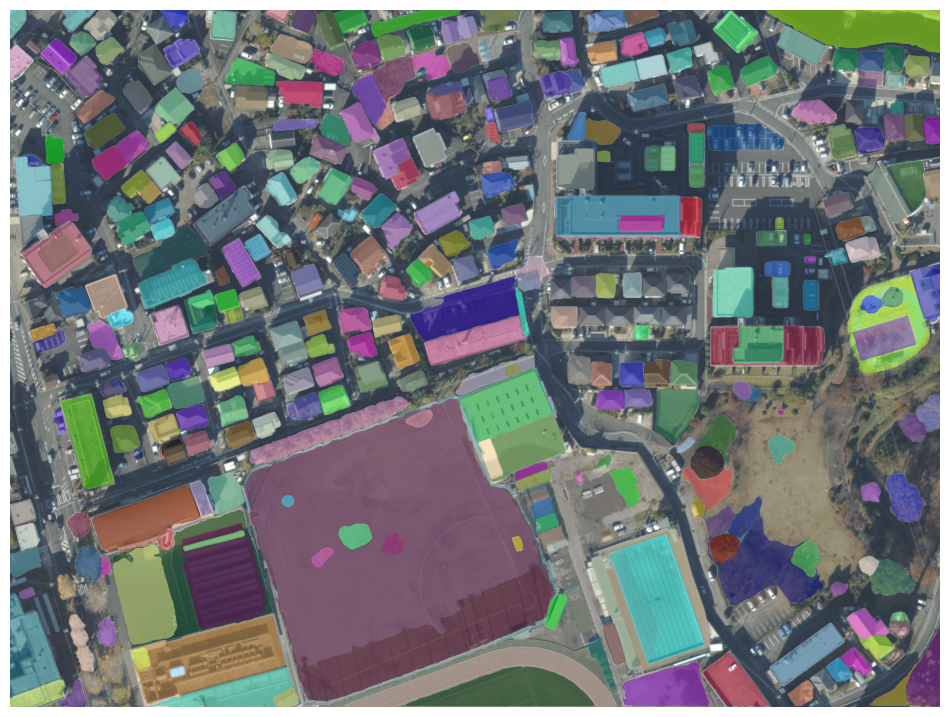

In [ ]:
# 航空写真上に判読結果を重ねて表示
sam.show_anns(axis="off", alpha=0.5, output="aerial_annotations.tif")

In [ ]:
# 航空写真と判読結果を並べて動的に比較できるように表示
# 処理が重いのでコメントアウトしています
"""
leafmap.image_comparison(
    aerial_image,
    "aerial_annotations.tif",
    label1="Aerial Image",
    label2="Aerial Image Segmentation",
)
"""

### ポイントで判読対象を指定

In [ ]:
# ポイントプロンプトに対応するように、segment geospatialを初期化
sam = SamGeo(
    model_type="vit_h",
    automatic=False,
    sam_kwargs=None,
)

航空写真をSegment Anything Modelにセットし、地図上で動的にセグメンテーションを実施

In [ ]:
sam.set_image(aerial_image)

In [ ]:
m = sam.show_map(basemap='OpenStreetMap')
m

OpenStreetMap has been already added before.


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

### テキストで判読対象を指定

In [ ]:
# テキストプロンプトに対応するように、segment-geospatialを初期化
sam = LangSAM()

In [ ]:
sam.set_image(aerial_image)
sam.show_map(basemap='OpenStreetMap')

OpenStreetMap has been already added before.


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

## 衛星画像への適用例

サンプルの衛星画像として、以下のものを使用しています。  
- 2023/05/05撮影のSentinel-2衛星画像  
画像ID:  COPERNICUS/S2_SR_HARMONIZED/20230505T013659_20230505T013655_T54STE  
範囲: 霧ヶ峰高原周辺でクリップ  

霧ヶ峰高原で発生した山火事の延焼跡を自動およびポイントやバウンディングボックスにて対象を指定して判読してみます。

In [ ]:
# 判読対象の衛星画像のパスを指定
satellite_image = './sample_data/Sentinel2_Kirigamine.tif'

leafmapを用いて判読対象の衛星画像を地図上に表示

In [ ]:
m = leafmap.Map(center=[36.08178, 138.18423], zoom=15, height="600px")
m.layers[-1].visible = True
m.add_raster(satellite_image, layer_name="Satellite imagelly")
m

Map(center=[36.08178, 138.18423], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', …

### 自動で判読

In [ ]:
# segment-geospatialを初期化
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=None,
)

In [ ]:
# 判読を実行
sam.generate(satellite_image, output="satellite_masks.tif", foreground=True, unique=True)

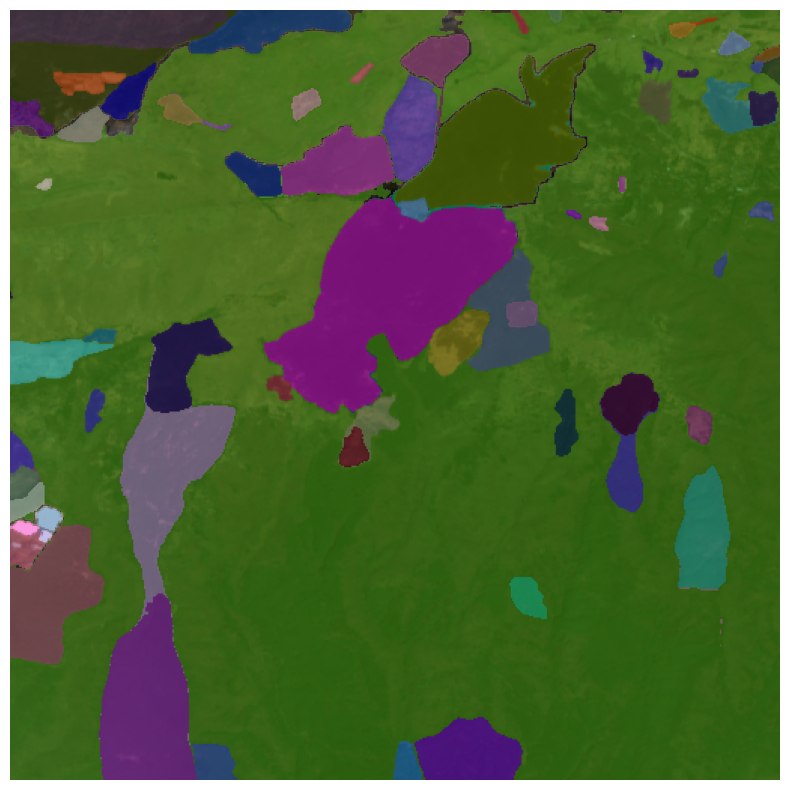

In [ ]:
# 衛星画像上に判読結果を重ねて表示
sam.show_anns(axis="off", alpha=0.5, output="satellite_annotations.tif")

### ポイントで判読対象を指定

In [ ]:
# ポイントプロンプトに対応するように、segment geospatialを初期化
sam = SamGeo(
    model_type="vit_h",
    automatic=False,
    sam_kwargs=None,
)

衛星画像をSegment Anything Modelにセットし、地図上で動的にセグメンテーションを実施

In [ ]:
sam.set_image(satellite_image)

In [ ]:
m = sam.show_map(basemap='OpenStreetMap')
m

OpenStreetMap has been already added before.


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

### バウンディングボックスで判読対象を指定  
**※ 2023/09/18現在、エラーが発生します**

In [ ]:
# GeoJSON形式で作成したバウンディングボックスのパス
bbox_geojson = './sample_data/bbox_burn_scar.geojson'

衛星画像とバウンディングボックスを地図上に重ねて表示

In [ ]:
m = leafmap.Map(center=[36.08178, 138.18423], zoom=15, height="600px")
m.add_raster(satellite_image, layer_name="Sattellite Image")
style = {
    "color": "#ffff00",
    "weight": 2,
    "fillColor": "#7c4185",
    "fillOpacity": 0,
}
m.add_vector(bbox_geojson, style=style, zoom_to_layer=True, layer_name="Bounding boxes")
m

Map(center=[36.08178, 138.18423], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', …

判読を実行

In [ ]:
# バウンディングボックスで判読対象を指示できるようにsegmenmt-geospatialを初期化
sam = SamGeo(
    model_type="vit_h",
    automatic=False,
    sam_kwargs=None,
)

In [ ]:
# 判読対象のSentinel-2衛星画像をSAMに入力
sam.set_image(satellite_image)

OutOfMemoryError: ignored

In [ ]:
# エラーが発生して判読が実行できない
sam.predict(boxes=bbox_geojson, point_crs="EPSG:4326", output="mask.tif", dtype="uint8")